In [1]:
import os
os.chdir('../tools')
import infer2

In [2]:

os.chdir('/Users/travistang/Documents/TorchScene/notebook')

In [3]:
scene = infer2.torchscene()

In [4]:
import glob
import pandas as pd
victor_img_list = glob.glob('/Users/travistang/Documents/TorchScene/data/images/victor_set/**.jpeg', recursive=True)
victor_img_list.sort()

In [5]:

len(victor_img_list)

4066

In [90]:
from PIL import Image
import matplotlib.pyplot as plt
from PIL.Image import Image as PilImage
import textwrap, os

def path_to_pil(path:str) -> PilImage:
    try:
        im = Image.open(path)
        return im
    except:
        return

def display_images(
    images: [PilImage], 
    columns=10, width=17, height=3, max_images=15, 
    label_wrap_length=50, label_font_size=8):

    if not images:
        print("No images to display.")
        return 

    if len(images) > max_images:
        print(f"Showing {max_images} images of {len(images)}:")
        images=images[0:max_images]

    height = max(height, int(len(images)/columns) * height)
    plt.figure(figsize=(width, height))
    for i, image in enumerate(images):
        plt.axis('off')
        plt.subplot(int(len(images) / columns + 1), columns, i + 1)
        plt.imshow(image)

        if hasattr(image, 'filename'):
            title=image.filename
            if title.endswith("/"): title = title[0:-1]
            title=os.path.basename(title)
            title=textwrap.wrap(title, label_wrap_length)
            title="\n".join(title)
            plt.title(title, fontsize=label_font_size); 

In [393]:
victor_img_df = pd.read_csv('/Users/travistang/Documents/TorchScene/data/csv/fake_merchant_tagging_combined_set_result.csv',index_col = [0])
victor_img_df['restaurant_cart_inappropriateness_label'] = victor_img_df['prediction_score'] < 0.6
victor_img_df = victor_img_df.query("victor_label_inappropriate_flag!=2")
# victor_img_df = victor_img_df[['source','saudagar_id','set','outlet_photo_url','victor_label_inappropriate_flag','prediction_score','restaurant_cart_inappropriateness_label']].drop_duplicates()

# if a saudagar_id is in validation and test, keep it in validation and drop it from test
victor_img_df = victor_img_df.sort_values('set',ascending=True).drop_duplicates(subset=['source','saudagar_id'],keep='last') 

victor_img_df

,source,entity_id,saudagar_id,last_action,last_rule,last_sanction_datetime,outlet_photo_url,bank_acc_name,bank_acc_no,cnt_diff_entity_shared_bank_acc,...,outlet_photo_tagging,flag_fake_merchant,victor_label_inappropriate_flag,restaurant_cart_inappropriateness_label,random,set,restaurant_store_cart_false_positive,restaurant_store_cart_false_negative,label,prediction_score
0,data,0012s00000NXGa6AAH,G285231232,SuspendMerchantPayout,IBT-M52-009-10A,2022-07-12 9:33:43,https://api.gobiz.co.id/v1/onboardings/data/SF...,MOHAMAD RIDWAN,8.330079e+09,302.0,...,1,Fake,1,True,0.904060,test,0.0,0.0,NaN,0.000354
2462,good_photos,NaN,G805388509,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,2,Fake,1,False,0.575984,test,0.0,1.0,NaN,0.999973
2463,good_photos,NaN,G024140195,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,2,Fake,1,False,0.575580,test,0.0,1.0,NaN,0.996800
2464,good_photos,NaN,G268180486,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,1,Fake,1,False,0.688902,test,0.0,1.0,NaN,0.999392
2470,good_photos,NaN,G290852858,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,0,Fake,0,False,0.916971,test,0.0,0.0,NaN,0.999991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
868,data,0012s00000L6Dq9AAF,G559142822,SuspendMerchantGoResto,IBT-M52-015A,2022-08-25 10:45:04,https://api.midtrans.com/v1/onboardings/data/S...,CHANTIKA ALWA PUTRI HEDI,2.316349e+08,4.0,...,1,Fake,1,False,0.269292,val,NaN,NaN,NaN,0.759632
2618,good_photos,NaN,G854199120,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,1,Fake,1,False,0.260184,val,0.0,1.0,NaN,0.992157
2619,good_photos,NaN,G028282079,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,2,Fake,1,False,0.118239,val,0.0,1.0,NaN,0.999997
882,data,0012s00000NXdNGAA1,G890179220,SuspendMerchantGoResto,IBT-M52-015-11A,2022-07-25 4:31:37,https://api.gobiz.co.id/v1/onboardings/data/SF...,Rizal Mochamad Sidiq,2.330421e+09,1.0,...,2,Fake,1,False,0.107777,val,0.0,1.0,NaN,0.996378


In [394]:
victor_img_df[victor_img_df['restaurant_cart_inappropriateness_label'].isna()]

,source,entity_id,saudagar_id,last_action,last_rule,last_sanction_datetime,outlet_photo_url,bank_acc_name,bank_acc_no,cnt_diff_entity_shared_bank_acc,...,outlet_photo_tagging,flag_fake_merchant,victor_label_inappropriate_flag,restaurant_cart_inappropriateness_label,random,set,restaurant_store_cart_false_positive,restaurant_store_cart_false_negative,label,prediction_score


# Get Baseline Performance 

In [395]:
from sklearn.metrics import accuracy_score, f1_score, classification_report

print("Validation Set performance")
print(classification_report(victor_img_df.query("set == 'val'")['victor_label_inappropriate_flag'],
                            victor_img_df.query("set == 'val'")['restaurant_cart_inappropriateness_label']))


print("Test Set performance")
print(classification_report(victor_img_df.query("set == 'test'")['victor_label_inappropriate_flag'],
                            victor_img_df.query("set == 'test'")['restaurant_cart_inappropriateness_label']))


Validation Set performance
              precision    recall  f1-score   support

           0       0.45      1.00      0.62       716
           1       1.00      0.35      0.52      1353

    accuracy                           0.57      2069
   macro avg       0.72      0.67      0.57      2069
weighted avg       0.81      0.57      0.55      2069

Test Set performance
              precision    recall  f1-score   support

           0       0.42      1.00      0.59       641
           1       0.99      0.34      0.51      1360

    accuracy                           0.55      2001
   macro avg       0.70      0.67      0.55      2001
weighted avg       0.81      0.55      0.53      2001



# Make predictions

In [7]:
scene_list = []
with open(scene.categories_map_dir, 'r') as f:
    lines = f.readlines()
    for line in lines:
        scene_list.append(line.split('/')[-1].split('\n')[0])

In [8]:
scene_list[0:2]

['airfield 0', 'airplane_cabin 1']

In [9]:
import pandas as pd
df_prediction_result = pd.DataFrame()
for img in victor_img_list:
        output = scene.pred(img)
        merchant_id = img.split('/')[8].split('.')[0]
        row_pred = pd.Series(output[0].tolist(), index = scene_list, name = merchant_id)
        df_prediction_result = pd.concat([df_prediction_result, pd.DataFrame(row_pred).transpose()])


In [146]:
for img in ['/Users/travistang/Documents/TorchScene/data/images/victor_set/G098424182.jpeg']:
        output = scene.pred(img)
        merchant_id = img.split('/')[8].split('.')[0]
        row_pred = pd.Series(output[0].tolist(), index = scene_list, name = merchant_id)

df_prediction_result = df_prediction_result.drop('G098424182')
df_prediction_result = pd.concat([df_prediction_result, pd.DataFrame(row_pred).transpose()])

In [384]:
df_prediction_result = df_prediction_result.drop_duplicates()

In [21]:
import torch
torch.Tensor([0]).repeat([365])[None, :]

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [150]:
df_prediction_result['pred'] = df_prediction_result.idxmax(axis=1)

In [385]:
df_prediction_result

,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,outdoor 8,aquarium 9,...,watering_hole 356,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364,pred
G000025204,1.169690e-05,0.000186,0.000309,0.001395,0.024793,2.879874e-04,0.001884,0.001499,3.111601e-05,0.001293,...,1.519202e-05,2.615452e-05,0.000419,1.274769e-05,1.307624e-05,1.780285e-05,0.006586,0.009236,2.328632e-04,slum 308
G000442330,3.289441e-06,0.000009,0.000205,0.000017,0.000002,3.090447e-06,0.146297,0.005256,1.600329e-06,0.000123,...,1.252322e-07,1.103174e-06,0.000114,7.748347e-06,2.424628e-06,6.480553e-06,0.000029,0.000019,1.198858e-06,fastfood_restaurant 139
G000490603,7.045807e-07,0.000014,0.000006,0.001480,0.006661,1.263931e-03,0.000239,0.000731,9.836851e-05,0.000137,...,2.205843e-06,7.807904e-07,0.000374,3.964149e-06,1.059960e-06,1.392358e-05,0.000686,0.000244,2.490898e-03,slum 308
G000554364,6.464958e-06,0.003822,0.000963,0.000842,0.000196,1.865353e-04,0.017430,0.000365,2.628397e-05,0.001755,...,1.279296e-06,3.455835e-06,0.012089,2.686340e-06,5.135385e-06,3.696392e-06,0.000016,0.000487,4.477550e-05,beauty_salon 50
G000585154,5.581808e-05,0.000438,0.000308,0.006228,0.000311,8.790768e-05,0.000021,0.000084,6.963746e-05,0.004295,...,6.552302e-04,1.121666e-03,0.000279,2.469731e-03,3.303591e-03,1.494749e-03,0.000373,0.000235,2.761134e-03,sand 116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G999372673,1.650799e-05,0.002913,0.000142,0.005151,0.000176,3.029582e-04,0.000074,0.000203,1.770933e-06,0.016001,...,1.225397e-04,1.459426e-04,0.000050,1.321362e-04,9.750272e-04,3.997931e-04,0.000104,0.000025,2.735144e-03,catacomb 85
G999693794,8.047726e-07,0.000001,0.000003,0.035797,0.001720,3.905532e-03,0.000004,0.000022,9.351089e-06,0.000061,...,3.129323e-06,9.459579e-07,0.000867,1.296522e-06,6.103583e-06,6.314453e-06,0.000066,0.000120,4.526545e-05,burial_chamber 69
G999790521,3.126588e-08,0.000005,0.000033,0.000537,0.000018,8.332009e-07,0.000906,0.000021,6.024833e-07,0.000883,...,1.131156e-07,4.630612e-07,0.000481,9.561104e-06,2.962080e-07,4.488750e-07,0.000021,0.001082,1.313785e-05,pet_shop 261
G999945838,8.434670e-08,0.000003,0.000004,0.004124,0.000210,8.417037e-07,0.000680,0.000015,5.812493e-06,0.000003,...,2.399273e-08,1.341721e-07,0.000766,3.690794e-07,4.966227e-07,7.252597e-07,0.000008,0.000627,1.846738e-07,pantry 253


In [386]:
df_prediction_result.to_csv('/Users/travistang/Documents/TorchScene/result/csv/victor_set_resnet18.csv')

In [396]:
victor_img_df = victor_img_df.merge(df_prediction_result['pred'], how='left', left_on = 'saudagar_id', right_index=True)

# Exploring the Validation Set

In [397]:
victor_img_val_df = victor_img_df.query('set == "val"')

In [398]:
victor_img_val_df.columns

Index(['source', 'entity_id', 'saudagar_id', 'last_action', 'last_rule',
       'last_sanction_datetime', 'outlet_photo_url', 'bank_acc_name',
       'bank_acc_no', 'cnt_diff_entity_shared_bank_acc',
       'diff_entity_id_shared_bank_acc',
       'cnt_diff_entity_outlet_shared_bank_acc',
       'diff_entity_outlet_id_shared_bank_acc', 'gofood_id', 'cnt_all_order',
       'sum_gmv_all_order', 'cnt_co', 'sum_gmv_co', 'cnt_maf_defect_order',
       'sum_gmv_maf_defect_order', 'cnt_cadf', 'sum_gmv_cadf', 'percent_co',
       'percent_good_order', 'percent_bad_order', 'photo',
       'outlet_photo_tagging', 'flag_fake_merchant',
       'victor_label_inappropriate_flag',
       'restaurant_cart_inappropriateness_label', 'random', 'set',
       'restaurant_store_cart_false_positive',
       'restaurant_store_cart_false_negative', 'label', 'prediction_score',
       'pred'],
      dtype='object')

In [399]:
victor_img_val_explore_str = victor_img_val_df.pivot_table(index = ['pred','restaurant_cart_inappropriateness_label'], columns = 'victor_label_inappropriate_flag', aggfunc = len)['source']

print(victor_img_val_explore_str.to_string())

victor_label_inappropriate_flag                                         0     1
pred                       restaurant_cart_inappropriateness_label             
airplane_cabin 1           False                                      1.0   NaN
alcove 3                   False                                      NaN   8.0
                           True                                       NaN   6.0
alley 4                    False                                      1.0   9.0
amusement_arcade 6         False                                     35.0   4.0
amusement_park 7           False                                      3.0   2.0
aquarium 9                 True                                       NaN   8.0
archive 14                 False                                      NaN   2.0
                           True                                       NaN   7.0
art_gallery 19             False                                      NaN   2.0
art_school 20              False        

In [400]:
victor_img_val_df.groupby(['victor_label_inappropriate_flag','restaurant_cart_inappropriateness_label','pred']).count()['source']

victor_label_inappropriate_flag  restaurant_cart_inappropriateness_label  pred              
0                                False                                    airplane_cabin 1       1
                                                                          alley 4                1
                                                                          amusement_arcade 6    35
                                                                          amusement_park 7       3
                                                                          art_studio 21          5
                                                                                                ..
1                                True                                     volcano 350            1
                                                                          waiting_room 352       1
                                                                          wheat_field 359        2
                

## Find categories which are correlated with high inappropriateness

In [401]:
# likely false
victor_img_val_df.query("pred == 'patio 259'")['saudagar_id']

3450    G160552866
3247    G297957783
3175    G725485923
3817    G757363936
4021    G018722912
3624    G560329621
4083    G634204186
3649    G561504561
2000    G171759106
2027    G195573522
2291    G696426343
1115    G033483073
2258    G285953214
2246    G258168045
1938    G508784070
1811    G262729010
1861    G941252158
1867    G064735132
1354    G246558411
2941    G184864731
2803    G250101808
3134    G089048667
909     G570337926
2409    G445206442
840     G426264794
899     G095395231
Name: saudagar_id, dtype: object

In [39]:
# likely false
victor_img_val_df.query("pred == 'porch 272'")['saudagar_id']

847     G642675497
850     G095890391
854     G219634494
974     G906895705
980     G252323082
1065    G651838578
1089    G634401073
1137    G532382674
1284    G092581972
1299    G937345844
1581    G304486568
1598    G351976179
1604    G824833617
1718    G600943243
1808    G770232205
1817    G523104358
1857    G912481828
1869    G995006263
1893    G598566229
1896    G817189008
2010    G417983563
2018    G614163390
2053    G031869245
2063    G586344978
2239    G678255982
2244    G171029437
2273    G048581047
2282    G877413319
2287    G617324864
2709    G840478075
2917    G688073778
2935    G473354133
3232    G335818148
3356    G597868563
3399    G757757271
3474    G002332078
3542    G520359348
4000    G969044764
4072    G002697502
4104    G492902063
Name: saudagar_id, dtype: object

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


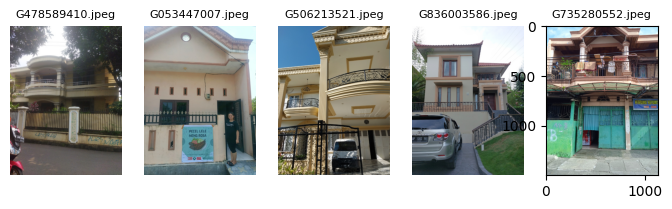

In [199]:
# slum: likely false images
mid_list = list(victor_img_val_df.query("pred == 'exterior 32'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

In [102]:
# Porch: likely false images
mid_list = list(victor_img_val_df.query("pred == 'barndoor 41'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


Showing 40 images of 59:


/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


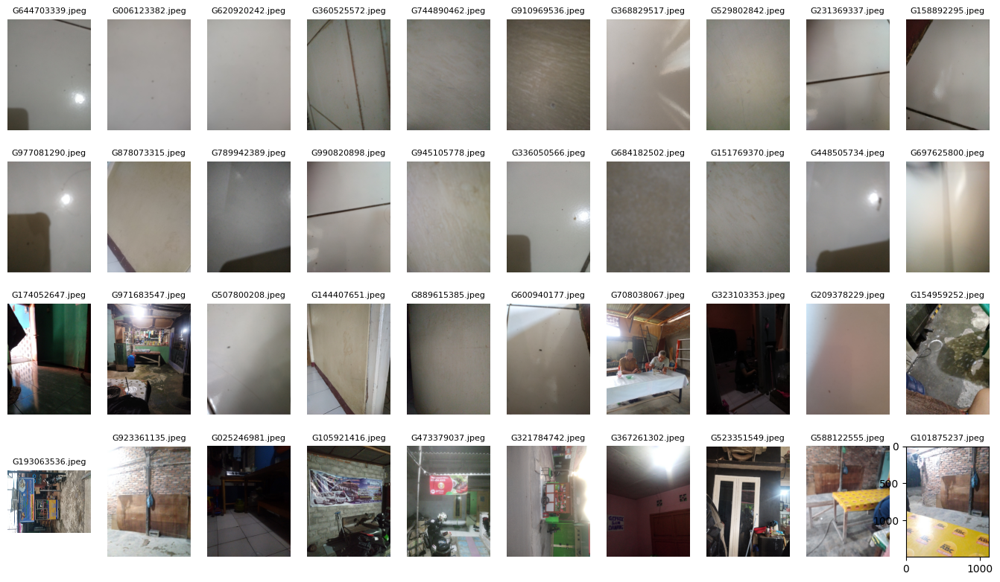

In [94]:
# basement: likely false images
mid_list = list(victor_img_val_df.query("pred == 'basement 43'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


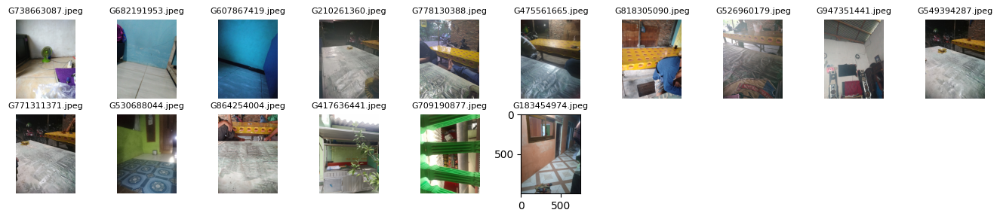

In [95]:
# basement: likely false images
mid_list = list(victor_img_val_df.query("pred == 'berth 55'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

Showing 40 images of 49:


/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


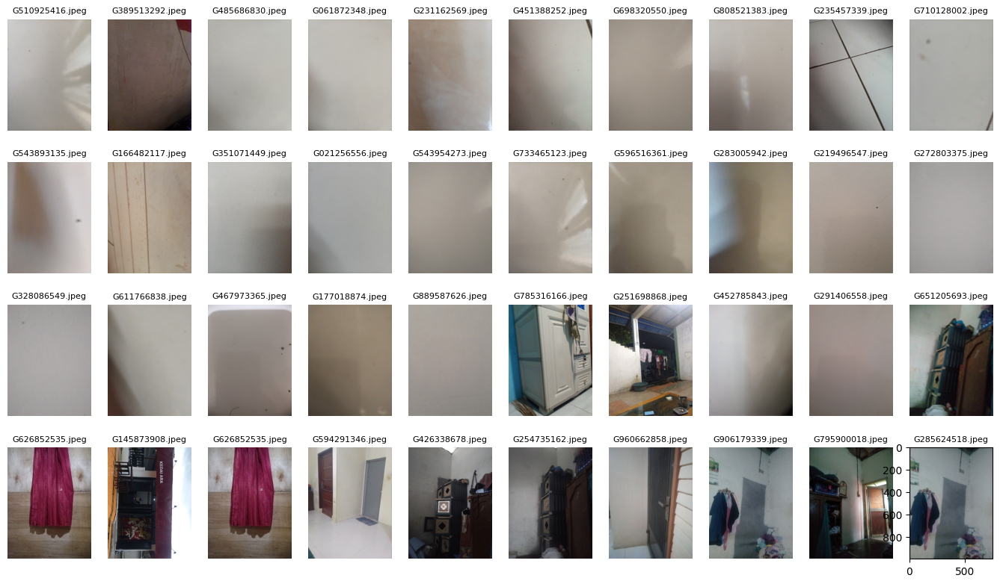

In [97]:
# closet: likely false images
mid_list = list(victor_img_val_df.query("pred == 'closet 95'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


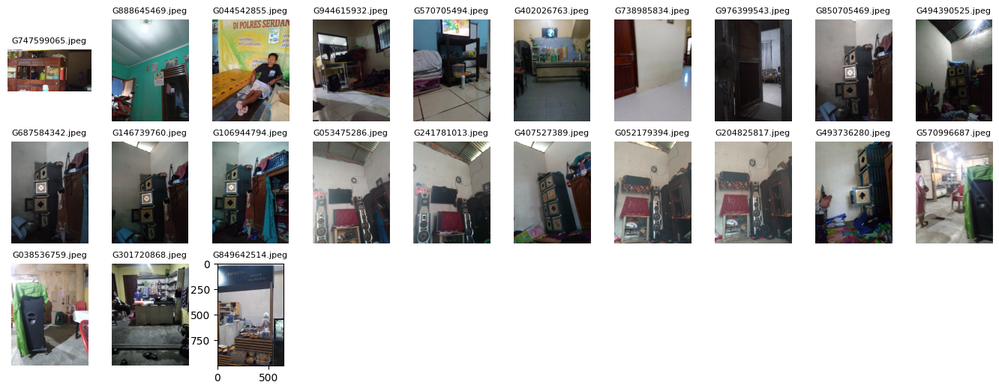

In [98]:
# dormroom: likely false images
mid_list = list(victor_img_val_df.query("pred == 'dorm_room 124'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

Showing 40 images of 78:


/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


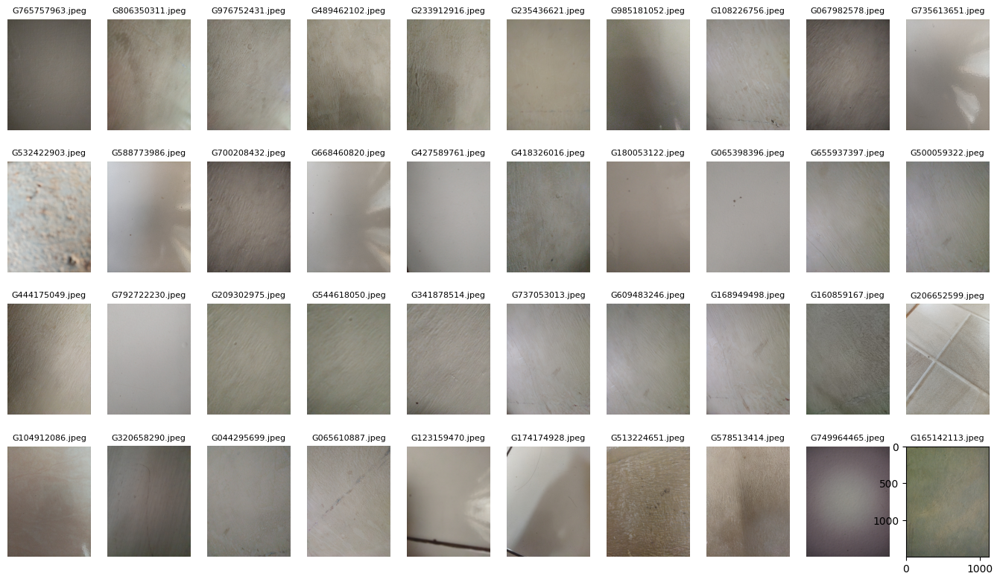

In [99]:
# sand: likely false images
mid_list = list(victor_img_val_df.query("pred == 'sand 116'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


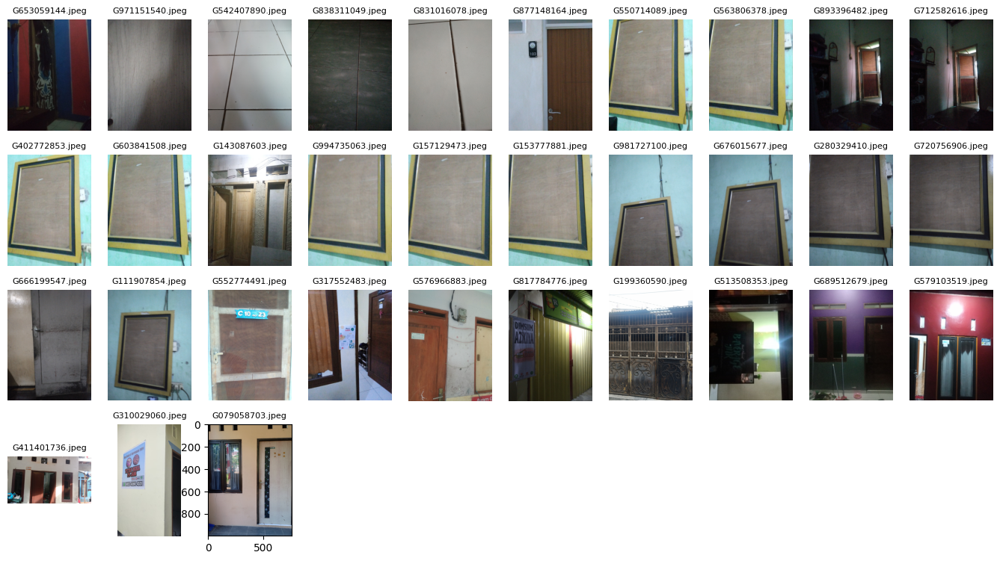

In [100]:
# door: likely false images
mid_list = list(victor_img_val_df.query("pred == 'door 129'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

Showing 40 images of 88:


/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


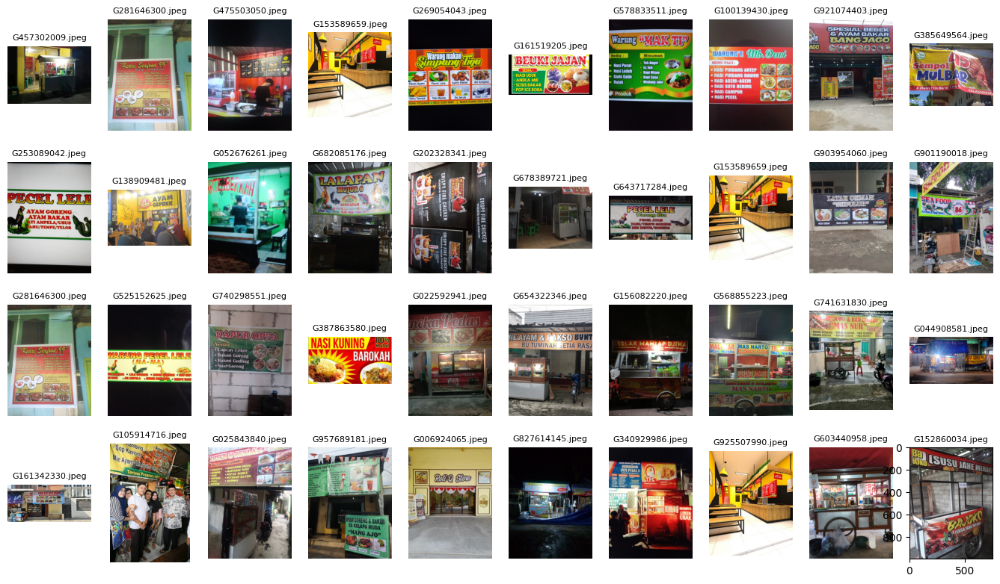

In [101]:
# fastfood_restaurant: likely true images
mid_list = list(victor_img_val_df.query("pred == 'fastfood_restaurant 139'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


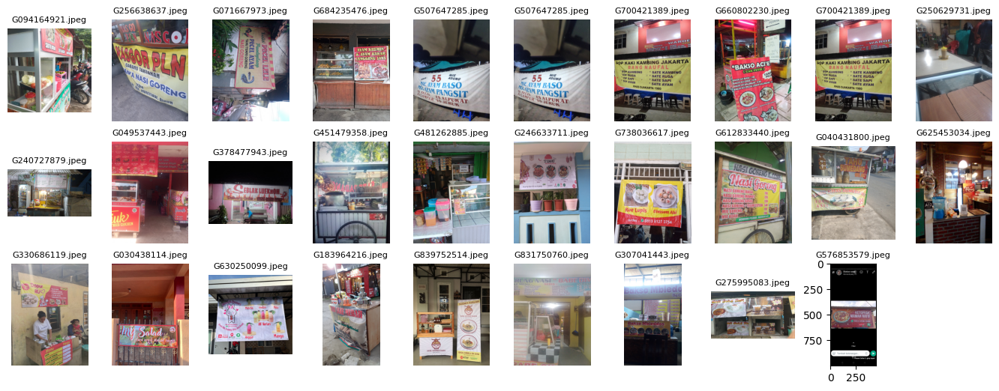

In [194]:
# ice cream parlor: likely false images
mid_list = list(victor_img_val_df.query("pred == 'ice_cream_parlor 185'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


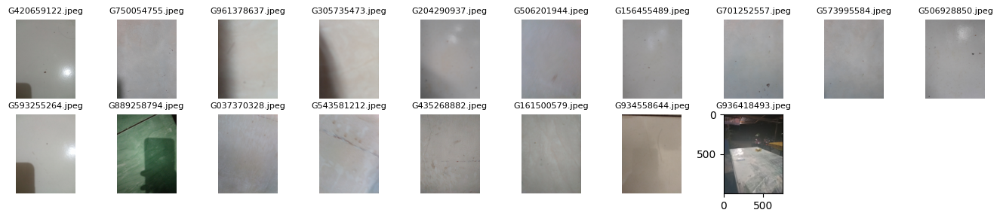

In [107]:
# fastfood_restaurant: likely true images
mid_list = list(victor_img_val_df.query("pred == 'igloo 191'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

In [206]:
# jacuzzi indoor 195: likely true images
mid_list = list(victor_img_val_df.query("pred == 'indoor 195'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

No images to display.


/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


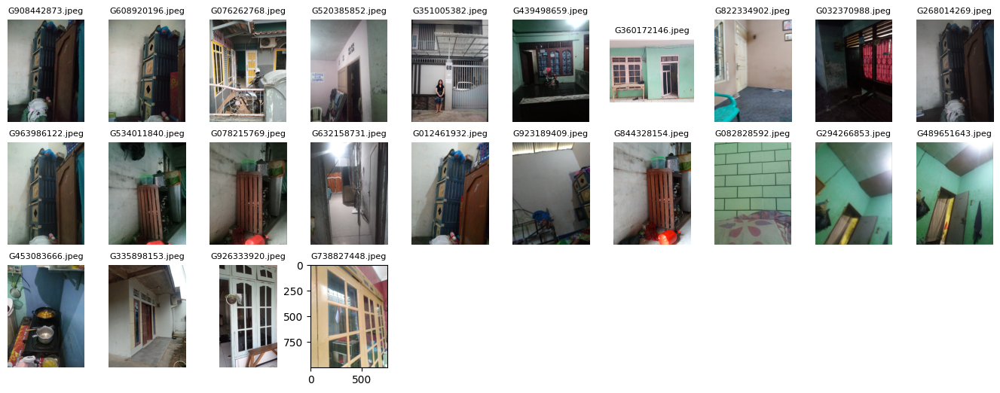

In [108]:
# basement: likely false images
mid_list = list(victor_img_val_df.query("pred == 'jail_cell 196'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


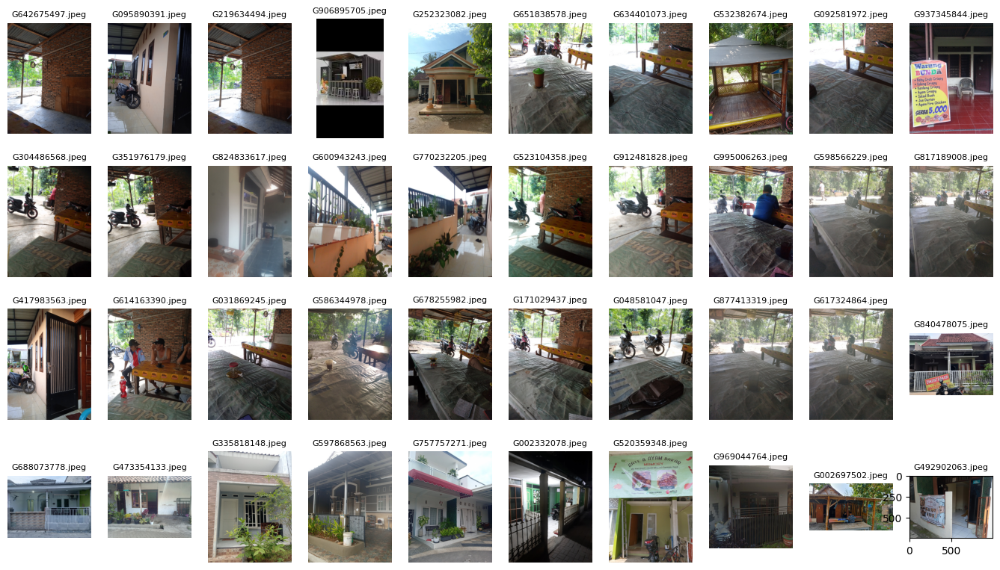

In [106]:
# Porch: likely false images
mid_list = list(victor_img_val_df.query("pred == 'porch 272'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


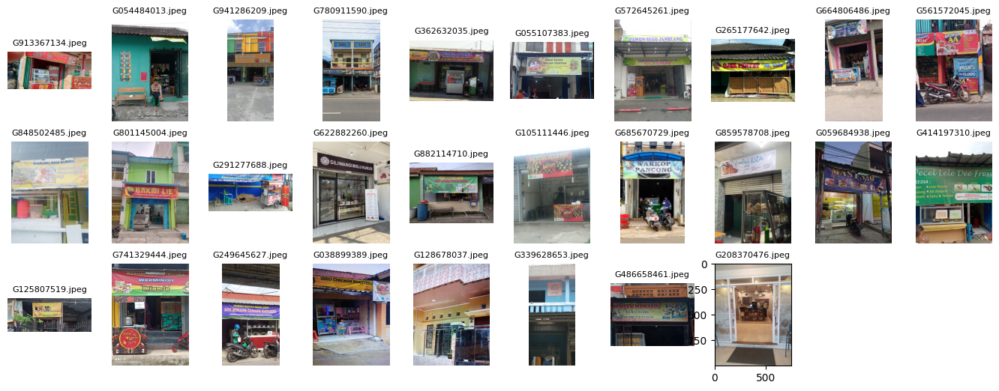

In [198]:
# shower: likely false images
mid_list = list(victor_img_val_df.query("pred == 'shopfront 301'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


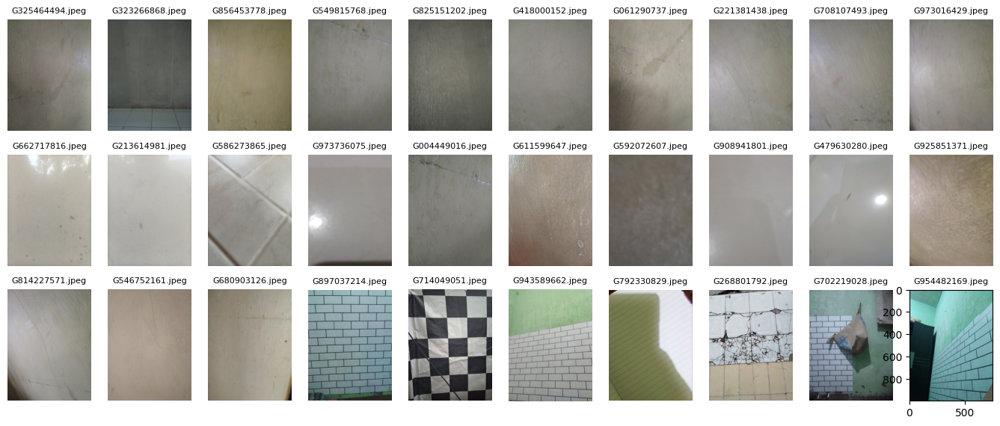

In [93]:
# shower: likely false images
mid_list = list(victor_img_val_df.query("pred == 'shower 303'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

Showing 40 images of 51:


/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


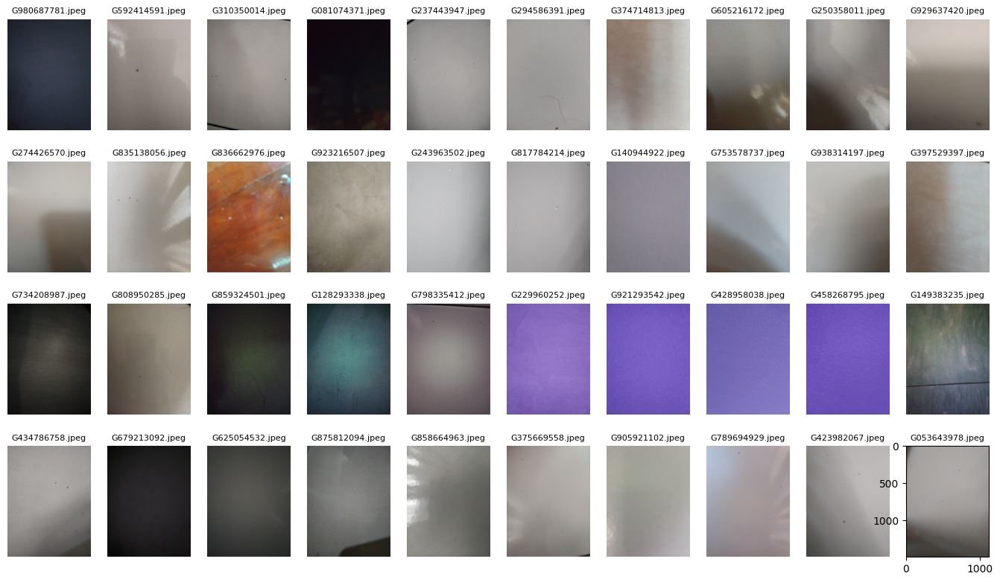

In [103]:
# Porch: likely false images
mid_list = list(victor_img_val_df.query("pred == 'sky 306'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


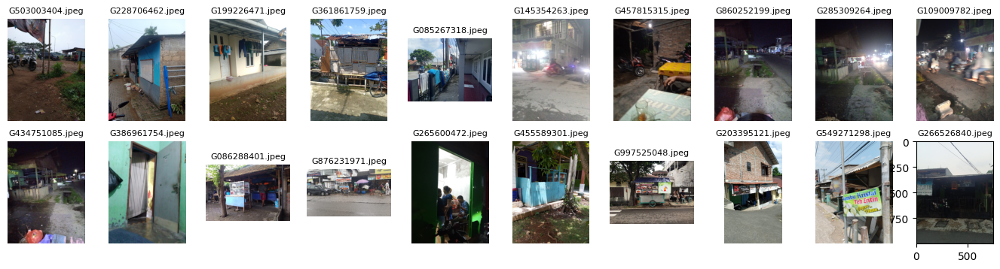

In [105]:
# slum: likely false images
mid_list = list(victor_img_val_df.query("pred == 'slum 308'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

Showing 40 images of 47:


/var/folders/21/qs32_5f92bb7kp238df281k00000gp/T/ipykernel_50604/272405815.py:30: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(int(len(images) / columns + 1), columns, i + 1)


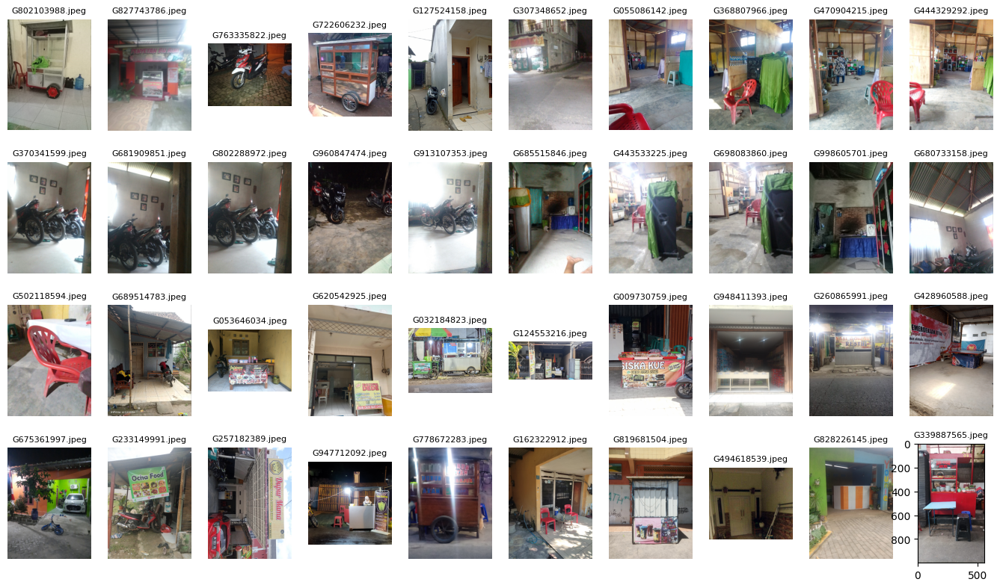

In [104]:
# Garage Indoor: likely false images
mid_list = list(victor_img_val_df.query("pred == 'indoor 156'")['saudagar_id'])
victor_img_val_porch = [path_to_pil('/Users/travistang/Documents/TorchScene/data/images/victor_set/' + mid + '.jpeg') for mid in mid_list]
display_images(victor_img_val_porch, max_images = 40)

In [109]:
!pip install tpot

  Using cached TPOT-0.11.7-py3-none-any.whl (87 kB)
  Using cached joblib-1.2.0-py3-none-any.whl (297 kB)
     |████████████████████████████████| 1.8 MB 14.7 MB/s eta 0:00:01
  Using cached update_checker-0.18.0-py3-none-any.whl (7.0 kB)
  Using cached tqdm-4.64.1-py2.py3-none-any.whl (78 kB)
     |████████████████████████████████| 8.7 MB 23.9 MB/s eta 0:00:01
     |████████████████████████████████| 34.3 MB 20.5 MB/s eta 0:00:01
     |████████████████████████████████| 109 kB 48.1 MB/s eta 0:00:01
  Using cached stopit-1.1.2.tar.gz (18 kB)
  Using cached threadpoolctl-3.1.0-py3-none-any.whl (14 kB)
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11956 sha256=ead723638bb23f1f8da8c16fb47b7d10fed422d6a805276dcd3d82f2501240f6
  Stored in directory: /Users/travistang/Library/Caches/pip/wheels/af/f9/87/bf5b3d565c2a007b4dae9d8142dccc85a9f164e517062dd519
Successfully built stopit
You should consider upgrading via the '/Users/travistang/opt/anaconda3/envs/torch-scene/bin/

# Using TPOT to train a decision tree classifier for the 365-length vector

In [402]:
victor_img_tpot_df = victor_img_df.merge(df_prediction_result.drop(columns=['pred']), how='left', left_on = 'saudagar_id', right_index=True)
victor_img_tpot_df = victor_img_tpot_df.dropna(subset=['airfield 0'])
victor_img_tpot_df = victor_img_tpot_df.set_index('saudagar_id')
victor_img_tpot_df = victor_img_tpot_df.query('set == "val"')

victor_img_tpot_df = victor_img_tpot_df.drop(columns = ['source', 'entity_id', 'last_action', 'last_rule',
       'last_sanction_datetime', 'outlet_photo_url', 'bank_acc_name',
       'bank_acc_no', 'cnt_diff_entity_shared_bank_acc',
       'diff_entity_id_shared_bank_acc',
       'cnt_diff_entity_outlet_shared_bank_acc',
       'diff_entity_outlet_id_shared_bank_acc', 'gofood_id', 'cnt_all_order',
       'sum_gmv_all_order', 'cnt_co', 'sum_gmv_co', 'cnt_maf_defect_order',
       'sum_gmv_maf_defect_order', 'cnt_cadf', 'sum_gmv_cadf', 'percent_co',
       'percent_good_order', 'percent_bad_order', 'photo',
       'outlet_photo_tagging', 'flag_fake_merchant', 'prediction_score',
       'restaurant_cart_inappropriateness_label',
       'random','set',
       'restaurant_store_cart_false_positive','restaurant_store_cart_false_negative','label'])
victor_img_tpot_df

,victor_label_inappropriate_flag,pred,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,...,waterfall 355,watering_hole 356,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364
saudagar_id,,,,,,,,,,,,,,,,,,,,,
G341646209,0,indoor 61,1.044018e-07,2.577401e-05,0.000040,0.000006,0.000024,0.000001,0.011066,0.000695,...,1.741644e-06,1.077568e-07,3.483915e-07,0.000024,2.870187e-06,1.306169e-06,5.693373e-07,0.000034,1.048400e-05,7.468568e-07
G217047851,0,indoor 61,2.410476e-06,9.800496e-06,0.000133,0.000055,0.000007,0.000350,0.087628,0.007391,...,2.275699e-06,1.472123e-07,9.475266e-07,0.000496,9.153538e-06,1.730458e-06,2.724099e-06,0.000015,1.501793e-05,4.521496e-06
G648689399,0,pet_shop 261,9.574789e-08,5.959731e-07,0.000004,0.001341,0.000326,0.000003,0.002135,0.000860,...,8.551498e-07,2.672232e-06,1.958193e-06,0.000147,3.143882e-06,2.087000e-06,2.049415e-06,0.002349,1.571927e-04,1.832540e-05
G308077671,1,outdoor 161,2.117730e-05,1.337473e-06,0.000017,0.000222,0.000738,0.001019,0.000049,0.000951,...,1.117521e-05,7.726232e-05,6.282718e-06,0.000010,7.398581e-05,1.355634e-05,1.714601e-04,0.001325,4.495236e-06,1.892587e-03
G310350014,1,sky 306,2.029986e-04,2.733929e-04,0.000128,0.007858,0.000063,0.000039,0.000015,0.000192,...,1.710537e-04,5.137792e-04,3.901127e-03,0.000358,1.871998e-03,5.674774e-03,2.120331e-03,0.000156,1.607973e-04,3.299310e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G318439890,0,ticket_booth 332,1.360974e-08,1.452911e-07,0.000029,0.000002,0.000028,0.000001,0.008169,0.000250,...,5.132075e-07,4.678020e-07,3.754907e-07,0.000029,2.592464e-07,1.407964e-07,1.578836e-07,0.000087,4.102541e-07,1.020888e-06
G559142822,1,living_room 215,1.366196e-06,1.126439e-04,0.000017,0.095281,0.000139,0.000465,0.001490,0.000158,...,1.424341e-06,1.083648e-05,7.159904e-06,0.015219,6.351623e-06,7.995354e-06,6.323814e-06,0.002332,8.178752e-03,5.546323e-04
G854199120,1,roof_garden 290,1.100500e-06,1.408586e-04,0.000023,0.000789,0.006795,0.000008,0.000114,0.000400,...,1.127474e-05,3.252036e-06,1.324676e-06,0.000058,1.664062e-05,6.828315e-06,1.274918e-05,0.032430,1.040897e-05,1.680212e-03


In [403]:
victor_img_tpot_df[victor_img_tpot_df.isnull().any(axis = 1)]

,victor_label_inappropriate_flag,pred,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,...,waterfall 355,watering_hole 356,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364
saudagar_id,,,,,,,,,,,,,,,,,,,,,


In [404]:
victor_img_tpot_df[victor_img_tpot_df['airplane_cabin 1']==0]

,victor_label_inappropriate_flag,pred,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,...,waterfall 355,watering_hole 356,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364
saudagar_id,,,,,,,,,,,,,,,,,,,,,


In [405]:
victor_img_tpot_df.columns

Index(['victor_label_inappropriate_flag', 'pred', 'airfield 0',
       'airplane_cabin 1', 'airport_terminal 2', 'alcove 3', 'alley 4',
       'amphitheater 5', 'amusement_arcade 6', 'amusement_park 7',
       ...
       'waterfall 355', 'watering_hole 356', 'wave 357', 'wet_bar 358',
       'wheat_field 359', 'wind_farm 360', 'windmill 361', 'yard 362',
       'youth_hostel 363', 'zen_garden 364'],
      dtype='object', length=367)

In [261]:
from tpot import TPOTClassifier
from sklearn.model_selection import train_test_split

target_col = 'victor_label_inappropriate_flag' #restaurant_store_cart_false_positive
X_train, X_test, y_train, y_test = train_test_split(victor_img_tpot_df.drop(columns=[target_col]), 
                                                    victor_img_tpot_df[target_col],
                                                    train_size=0.75, 
                                                    test_size=0.25,
                                                    random_state=42)


tpot_config = {
    'sklearn.tree.DecisionTreeClassifier': {
        'criterion': ["gini", "entropy", "log_loss"],
        'max_depth': [1, 10, 20, 30, 100],
        'random_state': [42],
        'min_samples_leaf': [1,2,5,10,20],
        'min_samples_split': [.25,.5,.75,2],
    }
}

# tpot = TPOTClassifier(generations=5, population_size=20, verbosity=2,
#                       config_dict=tpot_config)
tpot = TPOTClassifier(generations=5, population_size=20, verbosity=2,
                      config_dict="TPOT light")
tpot.fit(X_train, y_train)

                                                                             
Generation 1 - Current best internal CV score: 0.8514622757434258
                                                                             
Generation 2 - Current best internal CV score: 0.8514622757434258
                                                                             
Generation 3 - Current best internal CV score: 0.8514622757434258
                                                                              
Generation 4 - Current best internal CV score: 0.8546489719013681
                                                                              
Generation 5 - Current best internal CV score: 0.8559310231834193
                                                                              
Best pipeline: KNeighborsClassifier(input_matrix, n_neighbors=18, p=1, weights=distance)


TPOTClassifier(config_dict='TPOT light', generations=5, population_size=20,
               verbosity=2)

In [406]:
X_train

,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,outdoor 8,aquarium 9,...,waterfall 355,watering_hole 356,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364
saudagar_id,,,,,,,,,,,,,,,,,,,,,
G796883515,1.329493e-04,0.000246,0.000607,0.001641,0.000046,5.014040e-05,0.000159,0.000392,3.516185e-04,0.000450,...,4.812430e-06,1.730978e-06,8.154007e-06,0.001886,2.250997e-05,2.274354e-04,1.606872e-04,0.000060,0.005613,2.962971e-05
G978779815,1.860969e-06,0.000030,0.000016,0.000258,0.000315,2.402546e-07,0.003598,0.000013,1.097454e-06,0.000013,...,1.864811e-07,1.129081e-07,4.461822e-07,0.001111,6.541244e-07,2.045051e-06,1.739212e-06,0.000025,0.000244,4.351196e-07
G118089217,4.195585e-07,0.000002,0.000082,0.001003,0.000118,7.547701e-06,0.000001,0.000041,2.272844e-05,0.000041,...,5.765228e-07,6.484302e-07,2.727435e-06,0.001647,1.235724e-06,1.703247e-06,4.070592e-06,0.000189,0.000254,1.157838e-05
G913367134,1.066127e-06,0.000005,0.000029,0.000014,0.000082,1.810131e-06,0.003790,0.000157,2.239611e-06,0.000009,...,3.931494e-06,1.082671e-06,7.305413e-07,0.000006,5.467973e-06,7.522439e-07,1.616615e-06,0.000019,0.000199,3.533113e-06
G580017754,5.375793e-06,0.003054,0.000589,0.000035,0.000238,2.392832e-05,0.016278,0.001533,9.889614e-06,0.000363,...,1.676345e-05,8.320281e-07,3.248587e-06,0.000094,5.520507e-06,6.745257e-06,7.423385e-06,0.000151,0.000225,8.093906e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G002332078,2.451305e-06,0.000041,0.009453,0.000519,0.001970,4.270708e-05,0.000160,0.000994,1.175859e-04,0.000079,...,2.834667e-06,2.037144e-06,2.707453e-05,0.000414,2.129071e-06,2.122983e-05,2.410018e-05,0.000899,0.003635,8.671296e-05
G552774491,2.034914e-06,0.000005,0.000218,0.021790,0.000331,3.338644e-06,0.000253,0.000005,7.086430e-06,0.000372,...,2.918374e-07,3.783654e-07,8.102359e-07,0.009964,1.237712e-06,2.627724e-06,8.880322e-07,0.000082,0.000055,1.956774e-05
G504792232,5.280570e-08,0.000013,0.000004,0.000309,0.000006,7.452532e-06,0.084331,0.006566,1.503407e-07,0.000198,...,1.290290e-07,1.645574e-08,8.889492e-08,0.000018,3.152705e-07,2.119648e-07,5.522342e-07,0.000005,0.000029,2.099206e-06


In [407]:
victor_img_tpot_df['group'] = ''
victor_img_tpot_df.loc[victor_img_tpot_df.index.isin(X_train.index),'group']='val_train'
victor_img_tpot_df.loc[victor_img_tpot_df.index.isin(X_test.index),'group']='val_test'
victor_img_tpot_df

,victor_label_inappropriate_flag,pred,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,...,watering_hole 356,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364,group
saudagar_id,,,,,,,,,,,,,,,,,,,,,
G341646209,0,indoor 61,1.044018e-07,2.577401e-05,0.000040,0.000006,0.000024,0.000001,0.011066,0.000695,...,1.077568e-07,3.483915e-07,0.000024,2.870187e-06,1.306169e-06,5.693373e-07,0.000034,1.048400e-05,7.468568e-07,val_train
G217047851,0,indoor 61,2.410476e-06,9.800496e-06,0.000133,0.000055,0.000007,0.000350,0.087628,0.007391,...,1.472123e-07,9.475266e-07,0.000496,9.153538e-06,1.730458e-06,2.724099e-06,0.000015,1.501793e-05,4.521496e-06,val_train
G648689399,0,pet_shop 261,9.574789e-08,5.959731e-07,0.000004,0.001341,0.000326,0.000003,0.002135,0.000860,...,2.672232e-06,1.958193e-06,0.000147,3.143882e-06,2.087000e-06,2.049415e-06,0.002349,1.571927e-04,1.832540e-05,val_test
G308077671,1,outdoor 161,2.117730e-05,1.337473e-06,0.000017,0.000222,0.000738,0.001019,0.000049,0.000951,...,7.726232e-05,6.282718e-06,0.000010,7.398581e-05,1.355634e-05,1.714601e-04,0.001325,4.495236e-06,1.892587e-03,val_train
G310350014,1,sky 306,2.029986e-04,2.733929e-04,0.000128,0.007858,0.000063,0.000039,0.000015,0.000192,...,5.137792e-04,3.901127e-03,0.000358,1.871998e-03,5.674774e-03,2.120331e-03,0.000156,1.607973e-04,3.299310e-04,val_train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G318439890,0,ticket_booth 332,1.360974e-08,1.452911e-07,0.000029,0.000002,0.000028,0.000001,0.008169,0.000250,...,4.678020e-07,3.754907e-07,0.000029,2.592464e-07,1.407964e-07,1.578836e-07,0.000087,4.102541e-07,1.020888e-06,val_train
G559142822,1,living_room 215,1.366196e-06,1.126439e-04,0.000017,0.095281,0.000139,0.000465,0.001490,0.000158,...,1.083648e-05,7.159904e-06,0.015219,6.351623e-06,7.995354e-06,6.323814e-06,0.002332,8.178752e-03,5.546323e-04,val_test
G854199120,1,roof_garden 290,1.100500e-06,1.408586e-04,0.000023,0.000789,0.006795,0.000008,0.000114,0.000400,...,3.252036e-06,1.324676e-06,0.000058,1.664062e-05,6.828315e-06,1.274918e-05,0.032430,1.040897e-05,1.680212e-03,val_train


In [408]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_leaf=11, min_samples_split=9, random_state=42)
clf.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4, min_samples_leaf=11,
                       min_samples_split=9, random_state=42)

In [411]:
# Making predictions on inappropriateness using classifier
victor_img_tpot_df['inappropriate_prob'] = clf.predict_proba(victor_img_tpot_df.drop(columns=['victor_label_inappropriate_flag','group','pred','group']))[:,1]
victor_img_tpot_df

,victor_label_inappropriate_flag,pred,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,...,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364,group,inappropriate_prob
saudagar_id,,,,,,,,,,,,,,,,,,,,,
G341646209,0,indoor 61,1.044018e-07,2.577401e-05,0.000040,0.000006,0.000024,0.000001,0.011066,0.000695,...,3.483915e-07,0.000024,2.870187e-06,1.306169e-06,5.693373e-07,0.000034,1.048400e-05,7.468568e-07,val_train,0.158014
G217047851,0,indoor 61,2.410476e-06,9.800496e-06,0.000133,0.000055,0.000007,0.000350,0.087628,0.007391,...,9.475266e-07,0.000496,9.153538e-06,1.730458e-06,2.724099e-06,0.000015,1.501793e-05,4.521496e-06,val_train,0.158014
G648689399,0,pet_shop 261,9.574789e-08,5.959731e-07,0.000004,0.001341,0.000326,0.000003,0.002135,0.000860,...,1.958193e-06,0.000147,3.143882e-06,2.087000e-06,2.049415e-06,0.002349,1.571927e-04,1.832540e-05,val_test,0.158014
G308077671,1,outdoor 161,2.117730e-05,1.337473e-06,0.000017,0.000222,0.000738,0.001019,0.000049,0.000951,...,6.282718e-06,0.000010,7.398581e-05,1.355634e-05,1.714601e-04,0.001325,4.495236e-06,1.892587e-03,val_train,0.908676
G310350014,1,sky 306,2.029986e-04,2.733929e-04,0.000128,0.007858,0.000063,0.000039,0.000015,0.000192,...,3.901127e-03,0.000358,1.871998e-03,5.674774e-03,2.120331e-03,0.000156,1.607973e-04,3.299310e-04,val_train,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G318439890,0,ticket_booth 332,1.360974e-08,1.452911e-07,0.000029,0.000002,0.000028,0.000001,0.008169,0.000250,...,3.754907e-07,0.000029,2.592464e-07,1.407964e-07,1.578836e-07,0.000087,4.102541e-07,1.020888e-06,val_train,0.158014
G559142822,1,living_room 215,1.366196e-06,1.126439e-04,0.000017,0.095281,0.000139,0.000465,0.001490,0.000158,...,7.159904e-06,0.015219,6.351623e-06,7.995354e-06,6.323814e-06,0.002332,8.178752e-03,5.546323e-04,val_test,1.000000
G854199120,1,roof_garden 290,1.100500e-06,1.408586e-04,0.000023,0.000789,0.006795,0.000008,0.000114,0.000400,...,1.324676e-06,0.000058,1.664062e-05,6.828315e-06,1.274918e-05,0.032430,1.040897e-05,1.680212e-03,val_train,1.000000


In [423]:
victor_img_tpot_df_result = victor_img_tpot_df.merge(victor_img_df[['saudagar_id','outlet_photo_url','prediction_score']], how='left', left_index=True, right_on = 'saudagar_id').set_index('saudagar_id')
victor_img_tpot_df_result.to_csv('/Users/travistang/Documents/TorchScene/result/intemediate/victor_img_tpot_df_result tpot_221108 122pm.csv')

In [424]:
victor_img_tpot_df_result

,victor_label_inappropriate_flag,pred,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,...,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364,group,inappropriate_prob,outlet_photo_url,prediction_score
saudagar_id,,,,,,,,,,,,,,,,,,,,,
G341646209,0,indoor 61,1.044018e-07,2.577401e-05,0.000040,0.000006,0.000024,0.000001,0.011066,0.000695,...,2.870187e-06,1.306169e-06,5.693373e-07,0.000034,1.048400e-05,7.468568e-07,val_train,0.158014,https://api.gobiz.co.id/v1/onboardings/data/SF...,0.999986
G217047851,0,indoor 61,2.410476e-06,9.800496e-06,0.000133,0.000055,0.000007,0.000350,0.087628,0.007391,...,9.153538e-06,1.730458e-06,2.724099e-06,0.000015,1.501793e-05,4.521496e-06,val_train,0.158014,https://api.gobiz.co.id/v1/onboardings/data/SF...,0.999998
G648689399,0,pet_shop 261,9.574789e-08,5.959731e-07,0.000004,0.001341,0.000326,0.000003,0.002135,0.000860,...,3.143882e-06,2.087000e-06,2.049415e-06,0.002349,1.571927e-04,1.832540e-05,val_test,0.158014,https://api.gobiz.co.id/v1/onboardings/data/SF...,0.999526
G308077671,1,outdoor 161,2.117730e-05,1.337473e-06,0.000017,0.000222,0.000738,0.001019,0.000049,0.000951,...,7.398581e-05,1.355634e-05,1.714601e-04,0.001325,4.495236e-06,1.892587e-03,val_train,0.908676,https://api.gobiz.co.id/v1/onboardings/data/SF...,0.999955
G310350014,1,sky 306,2.029986e-04,2.733929e-04,0.000128,0.007858,0.000063,0.000039,0.000015,0.000192,...,1.871998e-03,5.674774e-03,2.120331e-03,0.000156,1.607973e-04,3.299310e-04,val_train,1.000000,https://api.gobiz.co.id/v1/onboardings/data/SF...,0.000031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G318439890,0,ticket_booth 332,1.360974e-08,1.452911e-07,0.000029,0.000002,0.000028,0.000001,0.008169,0.000250,...,2.592464e-07,1.407964e-07,1.578836e-07,0.000087,4.102541e-07,1.020888e-06,val_train,0.158014,https://api.gobiz.co.id/v1/onboardings/data/SF...,0.999969
G559142822,1,living_room 215,1.366196e-06,1.126439e-04,0.000017,0.095281,0.000139,0.000465,0.001490,0.000158,...,6.351623e-06,7.995354e-06,6.323814e-06,0.002332,8.178752e-03,5.546323e-04,val_test,1.000000,https://api.midtrans.com/v1/onboardings/data/S...,0.759632
G854199120,1,roof_garden 290,1.100500e-06,1.408586e-04,0.000023,0.000789,0.006795,0.000008,0.000114,0.000400,...,1.664062e-05,6.828315e-06,1.274918e-05,0.032430,1.040897e-05,1.680212e-03,val_train,1.000000,https://api.gobiz.co.id/v1/onboardings/data/SF...,0.992157


In [413]:
from sklearn.metrics import accuracy_score, f1_score, classification_report
y_pred = clf.predict(X_test)
y_score = clf.predict_proba(X_test)[:,1]
accuracy_score(y_test, y_pred)
print(classification_report(y_test,y_pred))


              precision    recall  f1-score   support

           0       0.70      0.76      0.73       169
           1       0.88      0.85      0.86       352

    accuracy                           0.82       521
   macro avg       0.79      0.80      0.80       521
weighted avg       0.82      0.82      0.82       521



In [414]:
# Comparing the above performance of the classifier with that of the baseline (restaurant-cart-model)

from sklearn.metrics import accuracy_score, f1_score, classification_report

print(classification_report(victor_img_df.loc[victor_img_df.saudagar_id.isin(X_test.index),"victor_label_inappropriate_flag"],
                            victor_img_df.loc[victor_img_df.saudagar_id.isin(X_test.index),"prediction_score"]<0.6))


# victor_img_tpot_df.loc[victor_img_tpot_df.index.isin(X_train.index),'group']='val_train'
# victor_img_tpot_df.loc[victor_img_tpot_df.index.isin(X_test.index),'group']='val_test'

              precision    recall  f1-score   support

           0       0.42      0.99      0.59       169
           1       0.99      0.34      0.50       352

    accuracy                           0.55       521
   macro avg       0.71      0.67      0.55       521
weighted avg       0.81      0.55      0.53       521



In [359]:
# clf.predict_proba(X_test)[:,1] > 0.5
# If we puzh the threshold to be 95%, then we can make sure that the precision is a whopping 98%. That is great.
print(classification_report(y_test, y_score > 0.95))

              precision    recall  f1-score   support

           0       0.52      0.98      0.68       169
           1       0.99      0.57      0.72       352

    accuracy                           0.70       521
   macro avg       0.75      0.78      0.70       521
weighted avg       0.83      0.70      0.71       521



In [415]:
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test, y_score)
precision, recall, thresholds

(array([0.6756238 , 0.67572816, 0.67836257, 0.832021  , 0.8315508 ,
        0.87905605, 0.90909091, 0.90849673, 0.91638796, 0.93189964,
        0.9384058 , 0.98522167, 1.        ]),
 array([1.        , 0.98863636, 0.98863636, 0.90056818, 0.88352273,
        0.84659091, 0.79545455, 0.78977273, 0.77840909, 0.73863636,
        0.73579545, 0.56818182, 0.        ]),
 array([0.05555556, 0.05882353, 0.15801354, 0.21052632, 0.31      ,
        0.70149254, 0.72727273, 0.75      , 0.78082192, 0.83333333,
        0.9086758 , 1.        ]))

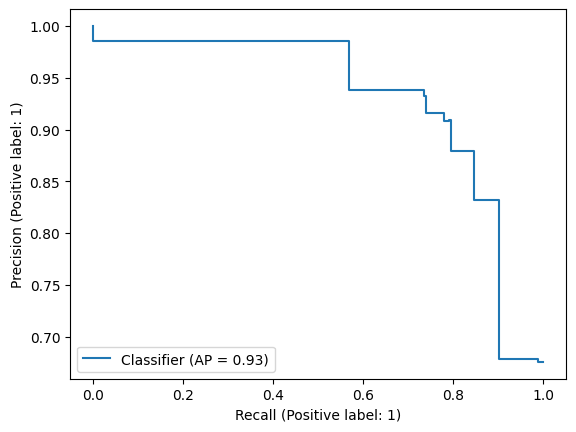

In [416]:
from sklearn.metrics import PrecisionRecallDisplay
PrecisionRecallDisplay.from_predictions(y_test, y_score)

In [417]:
victor_img_df

,source,entity_id,saudagar_id,last_action,last_rule,last_sanction_datetime,outlet_photo_url,bank_acc_name,bank_acc_no,cnt_diff_entity_shared_bank_acc,...,flag_fake_merchant,victor_label_inappropriate_flag,restaurant_cart_inappropriateness_label,random,set,restaurant_store_cart_false_positive,restaurant_store_cart_false_negative,label,prediction_score,pred
0,data,0012s00000NXGa6AAH,G285231232,SuspendMerchantPayout,IBT-M52-009-10A,2022-07-12 9:33:43,https://api.gobiz.co.id/v1/onboardings/data/SF...,MOHAMAD RIDWAN,8.330079e+09,302.0,...,Fake,1,True,0.904060,test,0.0,0.0,NaN,0.000354,burial_chamber 69
2462,good_photos,NaN,G805388509,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,Fake,1,False,0.575984,test,0.0,1.0,NaN,0.999973,kindergarden_classroom 202
2463,good_photos,NaN,G024140195,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,Fake,1,False,0.575580,test,0.0,1.0,NaN,0.996800,bar 39
2464,good_photos,NaN,G268180486,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,Fake,1,False,0.688902,test,0.0,1.0,NaN,0.999392,outdoor 256
2470,good_photos,NaN,G290852858,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,Fake,0,False,0.916971,test,0.0,0.0,NaN,0.999991,ticket_booth 332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
868,data,0012s00000L6Dq9AAF,G559142822,SuspendMerchantGoResto,IBT-M52-015A,2022-08-25 10:45:04,https://api.midtrans.com/v1/onboardings/data/S...,CHANTIKA ALWA PUTRI HEDI,2.316349e+08,4.0,...,Fake,1,False,0.269292,val,NaN,NaN,NaN,0.759632,living_room 215
2618,good_photos,NaN,G854199120,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,Fake,1,False,0.260184,val,0.0,1.0,NaN,0.992157,roof_garden 290
2619,good_photos,NaN,G028282079,NaN,NaN,NaN,https://api.gobiz.co.id/v1/onboardings/data/SF...,NaN,NaN,NaN,...,Fake,1,False,0.118239,val,0.0,1.0,NaN,0.999997,loading_dock 216
882,data,0012s00000NXdNGAA1,G890179220,SuspendMerchantGoResto,IBT-M52-015-11A,2022-07-25 4:31:37,https://api.gobiz.co.id/v1/onboardings/data/SF...,Rizal Mochamad Sidiq,2.330421e+09,1.0,...,Fake,1,False,0.107777,val,0.0,1.0,NaN,0.996378,NaN


In [276]:
y_test.unique()

array([0, 1])

In [277]:
from sklearn import tree
print(tree.export_text(clf))

|--- feature_139 <= 0.00
|   |--- feature_172 <= 0.01
|   |   |--- feature_303 <= 0.00
|   |   |   |--- feature_80 <= 0.00
|   |   |   |   |--- class: 1
|   |   |   |--- feature_80 >  0.00
|   |   |   |   |--- class: 0
|   |   |--- feature_303 >  0.00
|   |   |   |--- feature_301 <= 0.00
|   |   |   |   |--- class: 1
|   |   |   |--- feature_301 >  0.00
|   |   |   |   |--- class: 1
|   |--- feature_172 >  0.01
|   |   |--- feature_335 <= 0.00
|   |   |   |--- class: 1
|   |   |--- feature_335 >  0.00
|   |   |   |--- class: 0
|--- feature_139 >  0.00
|   |--- feature_301 <= 0.00
|   |   |--- feature_332 <= 0.00
|   |   |   |--- feature_198 <= 0.00
|   |   |   |   |--- class: 1
|   |   |   |--- feature_198 >  0.00
|   |   |   |   |--- class: 1
|   |   |--- feature_332 >  0.00
|   |   |   |--- feature_364 <= 0.00
|   |   |   |   |--- class: 0
|   |   |   |--- feature_364 >  0.00
|   |   |   |   |--- class: 1
|   |--- feature_301 >  0.00
|   |   |--- feature_185 <= 0.00
|   |   |   |--- 

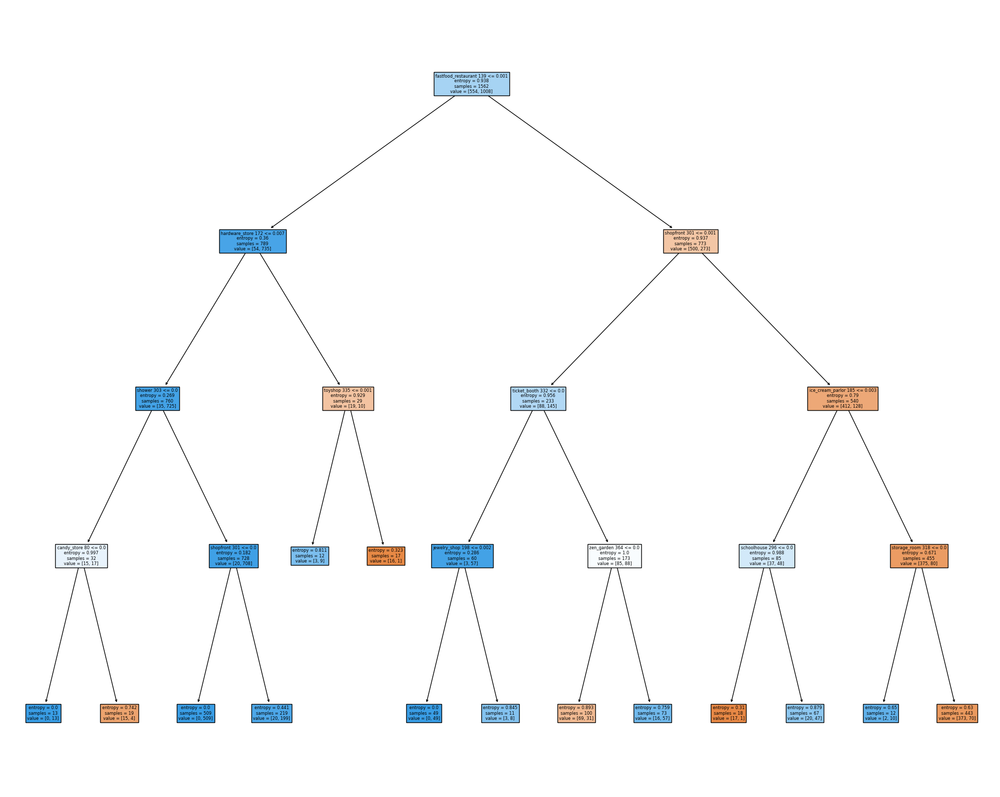

In [278]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(clf, 
                   feature_names=scene_list,  
                #    class_names=iris.target_names,
                   filled=True)

<AxesSubplot: >

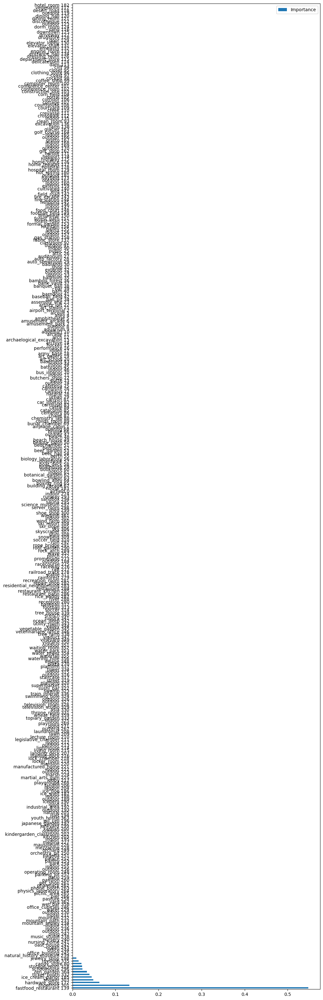

In [279]:

feat_importances = pd.DataFrame(clf.feature_importances_, index=scene_list, columns=["Importance"])
feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
feat_importances.plot(kind='barh', figsize=(10,40))

In [134]:
TPOTClassifier

AttributeError: 'Pipeline' object has no attribute 'plot_tree'

In [229]:

print(tpot.score(X_test, y_test))
tpot.export('../tpot/tpot_221108 122pm.py')

0.8406909788867563


/Users/travistang/opt/anaconda3/envs/torch-scene/lib/python3.10/site-packages/sklearn/metrics/_scorer.py:765: FutureWarning: sklearn.metrics.SCORERS is deprecated and will be removed in v1.3. Please use sklearn.metrics.get_scorer_names to get a list of available scorers and sklearn.metrics.get_metric to get scorer.
  warnings.warn(
/Users/travistang/opt/anaconda3/envs/torch-scene/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/Users/travistang/opt/anaconda3/envs/torch-scene/lib/python3.10/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


In [230]:
print(df_prediction_result.groupby(['pred']).count()['airfield 0'].to_string())

pred
airplane_cabin 1                  1
airport_terminal 2                2
alcove 3                         25
alley 4                          17
amusement_arcade 6               71
amusement_park 7                 10
aquarium 9                       16
archive 14                       15
art_gallery 19                    6
art_school 20                     6
art_studio 21                    29
artists_loft 22                   9
asia 330                          4
assembly_line 23                  3
attic 26                         13
auditorium 27                     4
auto_showroom 29                  2
badlands 30                       2
ball_pit 34                       6
bank_vault 37                     9
bar 39                            2
barn 40                           1
barndoor 41                      40
baseball 312                      2
basement 43                     118
bathroom 45                       6
beach 48                          4
beauty_salon 50        

In [20]:
df_prediction_result[df_prediction_result['pred'] == 'indoor 156']

,airfield 0,airplane_cabin 1,airport_terminal 2,alcove 3,alley 4,amphitheater 5,amusement_arcade 6,amusement_park 7,outdoor 8,aquarium 9,...,watering_hole 356,wave 357,wet_bar 358,wheat_field 359,wind_farm 360,windmill 361,yard 362,youth_hostel 363,zen_garden 364,pred
G003265614,5.980486e-06,3.133254e-05,0.000298,0.000517,0.000452,5.137763e-04,0.005538,0.001186,8.663887e-06,0.000530,...,4.946808e-06,2.658604e-06,0.001486,3.591667e-05,1.526900e-05,8.077818e-06,0.000898,0.000047,2.027183e-05,indoor 156
G003395865,1.819955e-05,9.587715e-05,0.000747,0.001206,0.007135,1.778102e-04,0.007296,0.001631,7.514679e-06,0.000319,...,8.033722e-06,3.627361e-05,0.000053,4.344244e-05,1.026125e-05,5.461308e-06,0.001055,0.006144,1.474686e-04,indoor 156
G004064774,1.266023e-06,1.439209e-04,0.000168,0.003790,0.003358,6.869353e-05,0.000743,0.000324,1.654245e-05,0.000670,...,2.138213e-06,2.346672e-05,0.001505,1.766330e-06,2.306481e-05,8.701652e-06,0.000287,0.004400,7.260408e-06,indoor 156
G009730759,4.432468e-06,1.435658e-05,0.000010,0.000073,0.001564,4.305375e-05,0.012547,0.000934,2.806309e-06,0.000054,...,8.545726e-07,2.258105e-06,0.000147,2.272965e-06,7.585714e-07,1.464758e-06,0.000340,0.000415,1.195235e-05,indoor 156
G032184823,1.956913e-05,1.081911e-05,0.000148,0.000198,0.001413,3.355678e-05,0.000550,0.003105,2.512199e-05,0.002957,...,1.051776e-05,1.295316e-05,0.000092,2.316528e-04,1.451136e-04,3.276312e-05,0.004021,0.000250,9.931240e-05,indoor 156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
G980818207,3.131699e-06,7.802162e-07,0.004085,0.000073,0.000111,8.837599e-05,0.004338,0.006607,4.380915e-06,0.000116,...,8.529317e-07,1.345742e-06,0.000016,5.886604e-06,9.841744e-07,1.186087e-05,0.000053,0.002542,1.937337e-05,indoor 156
G982803218,2.736857e-05,1.226932e-04,0.000306,0.000606,0.000234,1.143935e-04,0.000345,0.000358,3.871218e-05,0.000071,...,1.236595e-06,2.818310e-06,0.000185,1.649885e-06,9.768836e-06,3.267061e-06,0.000348,0.000173,1.137297e-05,indoor 156
G986682997,4.656724e-06,1.816355e-04,0.000040,0.012406,0.002550,5.376618e-06,0.001173,0.000013,1.562667e-05,0.000098,...,2.158771e-06,1.042852e-05,0.001101,4.299263e-05,9.504084e-06,1.195524e-05,0.000320,0.004939,6.458403e-05,indoor 156
G995230434,4.210787e-08,3.424912e-07,0.000002,0.000006,0.000034,2.083577e-08,0.000010,0.000002,9.478954e-08,0.000001,...,8.631230e-08,2.296595e-08,0.000003,1.452614e-08,2.989035e-08,1.284615e-08,0.000003,0.000004,5.905005e-07,indoor 156


In [ ]:
victor_img_df.merge